# 增强ALPHA
### 载入必要库
## 构建数据Pipeline
在线平台性能上很难满足大规模调试策略，加上机器学习或深度学习等计算密集型模型，所以本地回测如何提高效率是第一待解决的问题。
而zipline中的pipeline机制是很高效的。
### Bundle的注册
因为此项目我们用Zipline来处理数据，1.2章节中我们创建了数据Bundle。
此处我们需要注册创建的Bundle方便Zipline调用数据。
### 创建Pipeline引擎
我们将运用Pipeline包来处理股票数据。此前，我们需要创建Pipeline引擎，方便之后使用。
#### 查看数据
创建Pipeline引擎后，查看股票池最后一天的股票列表。

In [1]:
import sys
import project_helper
import project_tests

import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt

%matplotlib inline
plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (14, 8)

import sys
import os
from zipline.data import bundles

os.environ['ZIPLINE_ROOT'] = os.path.join('C:/Users/ltjsu/.zipline')

ingest_func = bundles.csvdir.csvdir_equities(['daily'], 'custom-csvdir-bundle')
bundles.register('custom-csvdir-bundle', ingest_func)

from zipline.pipeline import Pipeline
from zipline.pipeline.factors import AverageDollarVolume
from zipline.utils.calendars import get_calendar

trading_calendar = get_calendar('XSHG')
bundle_data = bundles.load('custom-csvdir-bundle')
engine = project_helper.build_pipeline_engine(bundle_data, trading_calendar)

C:\Users\ltjsu\.conda\envs\zipline_env\lib\site-packages\statsmodels\compat\pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


简单处理股票列表信息，方便获取申万行业数据。
### 获取收益率
构建DataPortal获取个股收益率数据。

自定义函数`get_pricing`获取股票收益率，增加代码可读性。

In [2]:
from zipline.data.data_portal import DataPortal
data_portal = DataPortal(
    bundle_data.asset_finder,
    trading_calendar=trading_calendar,
    first_trading_day=bundle_data.equity_daily_bar_reader.first_trading_day,
    equity_minute_reader=None,
    equity_daily_reader=bundle_data.equity_daily_bar_reader,
    adjustment_reader=bundle_data.adjustment_reader)

def get_pricing(data_portal, trading_calendar, assets, start_date, end_date, field='close'):
    end_dt = pd.Timestamp(end_date.strftime('%Y-%m-%d'), tz='UTC', offset='C')
    start_dt = pd.Timestamp(start_date.strftime('%Y-%m-%d'), tz='UTC', offset='C')

    end_loc = trading_calendar.closes.index.get_loc(end_dt)
    start_loc = trading_calendar.closes.index.get_loc(start_dt)

    return data_portal.get_history_window(
        assets=assets,
        end_dt=end_dt,
        bar_count=end_loc - start_loc,
        frequency='1d',
        field=field,
        data_frequency='daily')

# Alpha因子
定义Alpha因子。此项目主要关注以下因子：
- 动量因子_1年
- 行业中性均值回归_5日平滑因子
- 隔夜情绪平滑因子

**此处务必保证，factor_start_date不能是周末和节假日，不然后面会报错**

### 往Pipeline中添加因子
将以上因子添加到Pipeline中。

## 特征工程
定义一些对模型预测有帮助的特征。 好的基础特征能够作为显著的条件因子，对模型最终的预测有帮助。
### 一些”通用“量化特征
为了体现通用性，我们运用一下基础特征：
- 股票波动 20日平滑, 120日平滑
- 成交量量 20日平滑, 120日平滑
- 行业

### 市场特征
Regime Features
为了抓取市场特性，我们运用一下特征：
- 市场波动 20日平滑, 120日平滑
- 市场分散（离差） 20日平滑, 120日平滑

### 标签--预测目标
此项目对未来一周的收益做预测。因此量化目标过程中，因子追踪五日收益率。

### 日期特征
因为日历异象（calendar anomalies）的存在，此处定义一些日期相关的特征。

In [3]:
from zipline.pipeline.factors import CustomFactor, DailyReturns, Returns, SimpleMovingAverage, AnnualizedVolatility
from zipline.pipeline.data import USEquityPricing

universe_end_date = pd.Timestamp('2020-10-27', tz='UTC')
# 2020-09-28； 2020-08-28； 2020-07-28；2020-06-27；2020-05-28 
factor_start_date = universe_end_date - pd.DateOffset(years=5, days=4)
print(factor_start_date)
universe = AverageDollarVolume(window_length=120).top(500)
sector = project_helper.Sector()

def momentum_1yr(window_length, universe, sector):
    return Returns(window_length=window_length, mask=universe) \
        .demean(groupby=sector) \
        .rank() \
        .zscore()

def mean_reversion_5day_sector_neutral_smoothed(window_length, universe, sector):
    unsmoothed_factor = -Returns(window_length=window_length, mask=universe) \
        .demean(groupby=sector) \
        .rank() \
        .zscore()
    return SimpleMovingAverage(inputs=[unsmoothed_factor], window_length=window_length) \
        .rank() \
        .zscore()

class CTO(Returns):
    """
    Computes the overnight return, per hypothesis from
    https://papers.ssrn.com/sol3/papers.cfm?abstract_id=2554010
    """
    inputs = [USEquityPricing.open, USEquityPricing.close]
    
    def compute(self, today, assets, out, opens, closes):
        """
        The opens and closes matrix is 2 rows x N assets, with the most recent at the bottom.
        As such, opens[-1] is the most recent open, and closes[0] is the earlier close
        """
        out[:] = (opens[-1] - closes[0]) / closes[0]
        
class TrailingOvernightReturns(Returns):
    """
    Sum of trailing 1m O/N returns
    """
    window_safe = True
    
    def compute(self, today, asset_ids, out, cto):
        out[:] = np.nansum(cto, axis=0)

def overnight_sentiment_smoothed(cto_window_length, trail_overnight_returns_window_length, universe):
    cto_out = CTO(mask=universe, window_length=cto_window_length)
    unsmoothed_factor = TrailingOvernightReturns(inputs=[cto_out], window_length=trail_overnight_returns_window_length) \
        .rank() \
        .zscore()
    return SimpleMovingAverage(inputs=[unsmoothed_factor], window_length=trail_overnight_returns_window_length) \
        .rank() \
        .zscore()
        
class MarketDispersion(CustomFactor):
    inputs = [DailyReturns()]
    window_length = 1
    window_safe = True

    def compute(self, today, assets, out, returns):
        # returns are days in rows, assets across columns
        out[:] = np.sqrt(np.nanmean((returns - np.nanmean(returns))**2))
        
class MarketVolatility(CustomFactor):
    inputs = [DailyReturns()]
    window_length = 1
    window_safe = True
    
    def compute(self, today, assets, out, returns):
        mkt_returns = np.nanmean(returns, axis=1)
        out[:] = np.sqrt(260.* np.nanmean((mkt_returns-np.nanmean(mkt_returns))**2))
        

pipeline = Pipeline(screen=universe)
pipeline.add(momentum_1yr(252, universe, sector),'Momentum_1YR')
pipeline.add(mean_reversion_5day_sector_neutral_smoothed(20, universe, sector),'Mean_Reversion_Sector_Neutral_Smoothed')
pipeline.add(overnight_sentiment_smoothed(2, 10, universe),'Overnight_Sentiment_Smoothed')
pipeline.add(AnnualizedVolatility(window_length=20, mask=universe).rank().zscore(), 'volatility_20d')
pipeline.add(AnnualizedVolatility(window_length=120, mask=universe).rank().zscore(), 'volatility_120d')
pipeline.add(AverageDollarVolume(window_length=20, mask=universe).rank().zscore(), 'adv_20d')
pipeline.add(AverageDollarVolume(window_length=120, mask=universe).rank().zscore(), 'adv_120d')
pipeline.add(sector, 'sector_code')
pipeline.add(SimpleMovingAverage(inputs=[MarketDispersion(mask=universe)], window_length=20), 'dispersion_20d')
pipeline.add(SimpleMovingAverage(inputs=[MarketDispersion(mask=universe)], window_length=120), 'dispersion_120d')
pipeline.add(MarketVolatility(window_length=20), 'market_vol_20d')
pipeline.add(MarketVolatility(window_length=120), 'market_vol_120d')
pipeline.add(Returns(window_length=2, mask=universe).quantiles(2), 'return_1d')

all_factors = engine.run_pipeline(pipeline, factor_start_date, universe_end_date)
all_factors['is_Janaury'] = all_factors.index.get_level_values(0).month == 1
all_factors['is_December'] = all_factors.index.get_level_values(0).month == 12
all_factors['weekday'] = all_factors.index.get_level_values(0).weekday
all_factors['quarter'] = all_factors.index.get_level_values(0).quarter
all_factors['qtr_yr'] = all_factors.quarter.astype('str') + '_' + all_factors.index.get_level_values(0).year.astype('str')
all_factors['month_end'] = all_factors.index.get_level_values(0).isin(pd.date_range(start=factor_start_date, end=universe_end_date, freq='BM'))
all_factors['month_start'] = all_factors.index.get_level_values(0).isin(pd.date_range(start=factor_start_date, end=universe_end_date, freq='BMS'))
all_factors['qtr_end'] = all_factors.index.get_level_values(0).isin(pd.date_range(start=factor_start_date, end=universe_end_date, freq='BQ'))
all_factors['qtr_start'] = all_factors.index.get_level_values(0).isin(pd.date_range(start=factor_start_date, end=universe_end_date, freq='BQS'))

2015-10-23 00:00:00+00:00


去处5_10日回报中的异常数据。
### 行业信息独热编码
独热编码有助于模型更好的理解行业信息。

### 日期平移
每日收益率往前平移5/10日（一/两周），作为模型目标。
### 目标独立相似分布（IID）检测
查看平移不同时长的收益率之间是否是独立同分布。
**斯皮尔曼相关度计算**

In [4]:
from scipy.stats import spearmanr

def sp(group, col1_name, col2_name):
    x = group[col1_name]
    y = group[col2_name]
    return spearmanr(x, y)[0]

all_factors['return_1d'].replace(to_replace=-1, value=np.nan, inplace=True)

sector_lookup = pd.read_csv(
    os.path.join(os.getcwd(), 'data', 'project_7_sector', 'labels.csv'),
    index_col='Sector_i')['Sector'].to_dict()
sector_lookup

sector_columns = []
for sector_i, sector_name in sector_lookup.items():
    secotr_column = '{}行业'.format(sector_name)
    sector_columns.append(secotr_column)
    all_factors[secotr_column] = (all_factors['sector_code'] == sector_i)

all_factors['target_1D'] = all_factors.groupby(level=1)['return_1d'].shift(-1)

### 标签平移对于自相关的影响
从上图中可以观察到：

$ 自相关{Target1} > 自相关{Target2} > 自相关{Target3} > 自相关{Target4}$

自相关随着增加两次收益之间的间隔而减小。 自相关在正范围内，这意味着未来收益趋向于与过去收益相同的方向。此外，滞后1的自相关约在0.5附件振荡，滞后4的自相关约在0附近振荡，因此序列相关的程度从中等到非常低

这与股票收益通常表现出序列相关性是一致的

### 拆分训练集/验证集/测试集
将数据分为训练，验证和测试数据集。 实现函数“ train_valid_test_split”将输入样本“ all_x”和目标值“ all_y”分割为训练，验证和测试数据集。 比例大小分别是“ train_size”，“ valid_size”和“ test_size”。

分割时，请确保数据分别来自训练，验证和测试的顺序。 假设“ train_size”为0.7，“ valid_size”为0.2，而“ test_size”为0.1。 all_x和all_y的前70％是训练集合。 接下来的all_x和all_y 20％将是验证集。 all_x和all_y的最后10％是测试集。 确保不要将同一天分配给多个数据集，它应包含在单个数据集中。

得到`train_valid_test_split`之后，就可以将数据拆分成训练集、验证集和测试集。
选取如下特征和5日收益率为预测目标。

In [5]:
def train_valid_test_split(all_x, all_y, train_size, valid_size, test_size):
    """
    Generate the train, validation, and test dataset.
    """
    assert train_size >= 0 and train_size <= 1.0
    assert valid_size >= 0 and valid_size <= 1.0
    assert test_size >= 0 and test_size <= 1.0
    assert train_size + valid_size + test_size == 1.0
    
    # TODO: Implement
    train_inx = int(len(all_x) * train_size)
    valid_ind = int(len(all_x) * (train_size + valid_size))
    x_train = all_x[:train_inx]
    x_valid = all_x[train_inx:valid_ind]
    x_test  = all_x[valid_ind:]
    y_train = all_y[:train_inx]
    y_valid = all_y[train_inx:valid_ind]
    y_test  = all_y[valid_ind:]
    
    return x_train, x_valid, x_test, y_train, y_valid, y_test

project_tests.test_train_valid_test_split(train_valid_test_split)

features = [
    'Mean_Reversion_Sector_Neutral_Smoothed', 'Momentum_1YR',
    'Overnight_Sentiment_Smoothed', 'adv_120d', 'adv_20d',
    'dispersion_120d', 'dispersion_20d', 'market_vol_120d',
    'market_vol_20d', 'volatility_20d',
    'is_Janaury', 'is_December', 'weekday',
    'month_end', 'month_start', 'qtr_end', 'qtr_start'] + sector_columns
target_label = 'target_1D'

temp = all_factors.dropna().copy()
X = temp[features]
y = temp[target_label].astype(int)

X_train, X_valid, X_test, y_train, y_valid, y_test = train_valid_test_split(X, y, 0.8, 0.1, 0.1)

Tests Passed


In [6]:
y_train.value_counts()

0    197123
1    196796
Name: target_1D, dtype: int64

# 集成学习
## 随即森林
### 决策树
单个决策树决策效果展示。

**对标的日期不做区分，使得此模型对股票种类不敏感，时序信息也丢失较多**

**对单一标定分别进行训练，将学习出属于不同标的的特性。高频数据将解决数据不够的问题**

### 随机森林超参数 -- 决策树数量
定义不同参数，来确定最好的模型。
#### 参数
参见以下参数

##### min_samples_leaf
min_samples_leaf ： 决策树每个叶--也就是决策树最底层样本数量。 足够小，有助于模型抓住数据细节；过于小，模型容易过拟合。
此参数的值以股票池股票数量的倍数为宜。当夏普率大于4的时候，往往是过拟合的征兆，因此建议设置为10倍股票数量。

次倍数可以调节，但过度调试也会在验证集上过拟合，从而降低模型泛化性，样本外数据表现很差。 因此倍数以指数的形式变动（10倍，20倍，100倍，而不是10倍11倍12倍...）。

##### n_trees_l
参考下图，分类器准确率随着决策树数量的变化。

#### 判定过/欠拟合

- 图中验本外数据比验证集准确率高；决策树数量较少时，训练和样本外集准确率随着决策树增加而增加，而验证集下降，决策树数量较多时，准确率不在变化。
- 准确率的差值可以用来判定过/欠拟合（差距较大--过拟合；差距小--欠拟合）

下标展示，各特征的特征重要度在众多决策树上的均值。

In [7]:
from IPython.display import display
from sklearn.tree import DecisionTreeClassifier

# This is to get consistent results between each run.
clf_random_state = 0
MAX_DEPTH = 4
n_days = 10
n_stocks = 500

clf_parameters = {
    'criterion': 'entropy',
    'min_samples_leaf': n_stocks * n_days,
    'oob_score': True,
    'n_jobs': -1,
    'random_state': clf_random_state}
n_trees = 300

from sklearn.ensemble import RandomForestClassifier


clf = RandomForestClassifier(n_trees, **clf_parameters)
clf.fit(pd.concat([X_train, X_valid]), 
        pd.concat([y_train, y_valid]))
    
print('train: {}, oob: {}, valid: {}'.format(
    clf.score(X_train, y_train.values),
    clf.score(X_valid, y_valid.values),
    clf.oob_score_))

train: 0.5248591715555736, oob: 0.5196385052802599, valid: 0.5167016804352388


上表中有些特征的特征重要度是0，之后的模型训练不在用这些特征。
### 模型结果
一下而外的指标讲用于衡量模型的预测能力。函数 `show_sample_results` 用来计算如下指标：
- 夏普率
- 因子回报率
- 因子自相关系数排序

**此处是用alphalens，评估模型性能，并不考虑交易成本**

#### 预测效果
用一下几个因子与增强因子做个比较：

##### 训练
模型在训练集上训练。

In [ ]:
import alphalens as al

all_assets = all_factors.index.levels[1].values.tolist()
all_pricing = get_pricing(
    data_portal,
    trading_calendar,
    all_assets,
    factor_start_date,
    universe_end_date)

def get_IC(factor_data):
    ls_IC = pd.DataFrame()
    
    for factor, factor_data in factor_data.items():
        ls_IC[factor] = al.performance.factor_information_coefficient(factor_data).iloc[:,0]
        print(factor)
        al.tears.create_full_tear_sheet(factor_data)
        
    return ls_IC

def show_sample_results(data, samples, classifier, factors, pricing=all_pricing,max_loss=0.35):
    # Calculate the Alpha Score
    prob_array=[-1,1]
    print(classifier.predict_proba(samples)[0])
    alpha_score = classifier.predict_proba(samples).dot(np.array(prob_array))
    
    # Add Alpha Score to rest of the factors
    alpha_score_label = '增强_ALPHA'
    factors_with_alpha = data.loc[samples.index].copy()
    factors_with_alpha[alpha_score_label] = alpha_score
    
    # Setup data for AlphaLens
    print('Cleaning Data...\n')
    factor_data = project_helper.build_factor_data(factors_with_alpha[factors + [alpha_score_label]], 
                                                   pricing,max_loss=max_loss,periods = (1,5))
    print('\n-----------------------\n')
    
    # Calculate Factor Returns and Sharpe Ratio
    factor_returns = project_helper.get_factor_returns(factor_data)
    sharpe_ratio = project_helper.sharpe_ratio(factor_returns)
    
    # Show Results
    print('             Sharpe Ratios')
    print(sharpe_ratio.round(2))
    project_helper.plot_factor_returns(factor_returns)
    project_helper.plot_factor_rank_autocorrelation(factor_data)
    
    factor_IC = get_IC(factor_data)
    print(factor_IC.mean())
    return factor_IC
    
factor_names = [
    'Mean_Reversion_Sector_Neutral_Smoothed',
    'Momentum_1YR',
    'Overnight_Sentiment_Smoothed',
    'adv_120d',
    'volatility_20d',
    'adv_20d']

C:\Users\ltjsu\.conda\envs\zipline_env\lib\site-packages\ipykernel_launcher.py:11: FutureWarning: offset is deprecated. Use freq instead
  # This is added back by InteractiveShellApp.init_path()
C:\Users\ltjsu\.conda\envs\zipline_env\lib\site-packages\ipykernel_launcher.py:12: FutureWarning: offset is deprecated. Use freq instead
  if sys.path[0] == '':


[ 0.48640681  0.51359319]
Cleaning Data...

Dropped 0.7% entries from factor data: 0.7% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 40.0%, not exceeded: OK!
Dropped 0.7% entries from factor data: 0.7% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 40.0%, not exceeded: OK!
Dropped 0.7% entries from factor data: 0.7% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 40.0%, not exceeded: OK!
Dropped 0.7% entries from factor data: 0.7% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 40.0%, not exceeded: OK!
Dropped 0.7% entries from factor data: 0.7% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss

,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-1.72854817,-0.81723749,-1.37131317,0.20305079,88482,20.10004362
2,-1.16673179,-0.06098787,-0.68868237,0.19902485,87827,19.95125032
3,-0.52522978,0.54889085,-0.01527481,0.20408890,87814,19.94829717
4,0.14400461,1.15063786,0.66870060,0.21468791,87827,19.95125032
5,0.77881655,1.72853395,1.37165921,0.20879368,88258,20.04915858


Returns Analysis


,1D,5D
Ann. alpha,-0.02200000,-0.01100000
beta,-0.04500000,-0.05900000
Mean Period Wise Return Top Quantile (bps),-0.22600000,-0.23500000
Mean Period Wise Return Bottom Quantile (bps),1.63100000,1.21900000
Mean Period Wise Spread (bps),-1.78800000,-1.32500000


C:\Users\ltjsu\.conda\envs\zipline_env\lib\site-packages\pandas\core\indexes\datetimes.py:831: PerformanceWarning: Non-vectorized DateOffset being applied to Series or DatetimeIndex
  "or DatetimeIndex", PerformanceWarning)


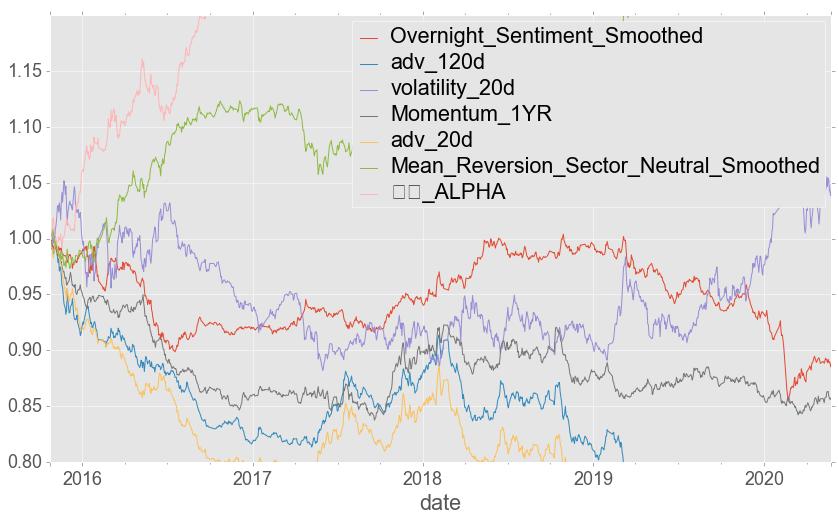

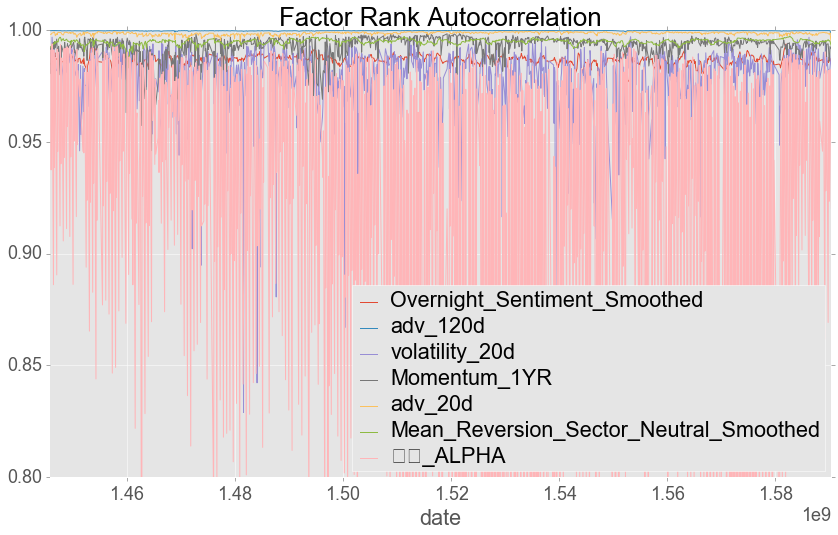

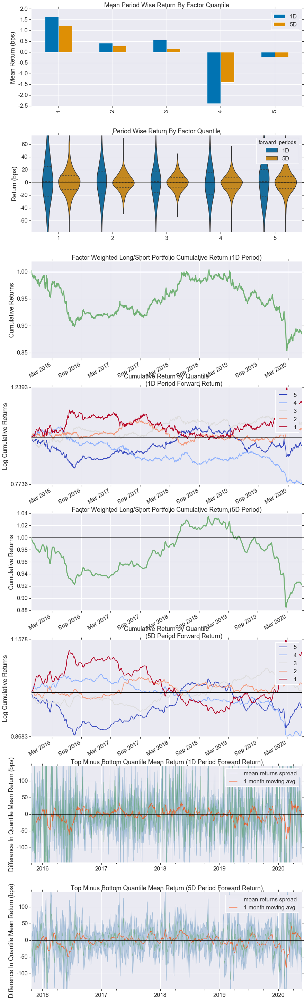

Information Analysis


,1D,5D
IC Mean,0.00200000,0.00300000
IC Std.,0.09900000,0.10500000
Risk-Adjusted IC,0.02200000,0.02800000
t-stat(IC),0.75100000,0.94600000
p-value(IC),0.45300000,0.34400000
IC Skew,-0.12600000,-0.62100000
IC Kurtosis,1.43700000,2.35900000


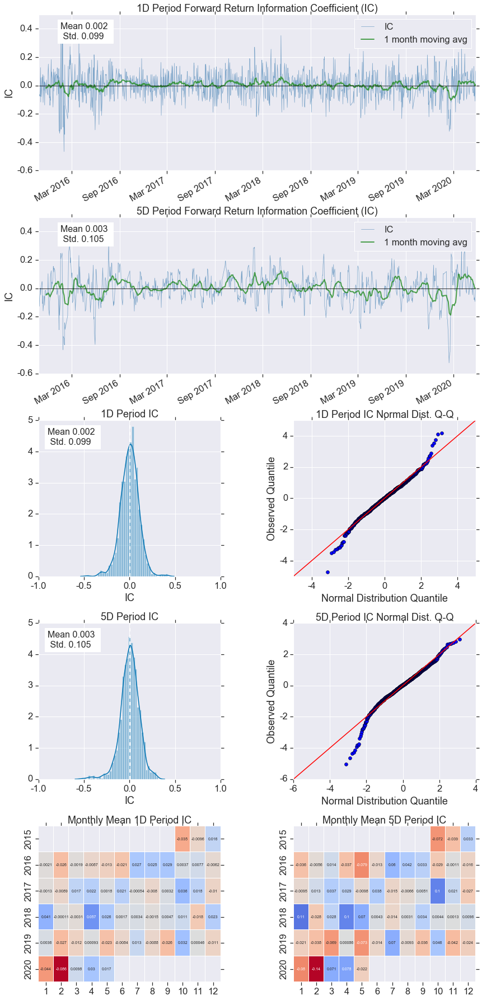

Turnover Analysis


,1D,5D
Quantile 1 Mean Turnover,0.09000000,0.37700000
Quantile 2 Mean Turnover,0.20600000,0.65200000
Quantile 3 Mean Turnover,0.24000000,0.69600000
Quantile 4 Mean Turnover,0.21600000,0.66700000
Quantile 5 Mean Turnover,0.09700000,0.40500000


,1D,5D
Mean Factor Rank Autocorrelation,0.98700000,0.76100000


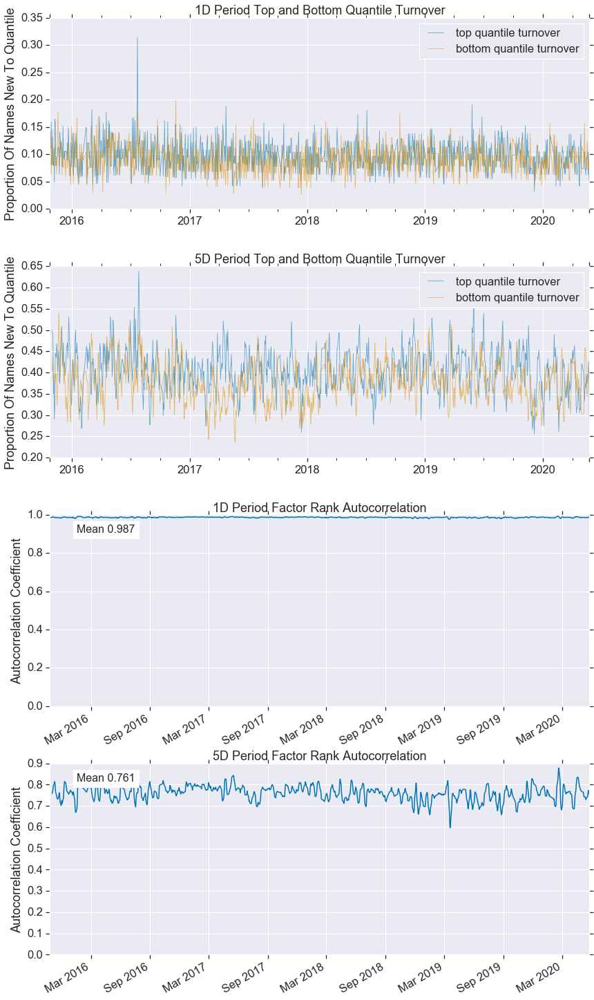

adv_120d
Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-1.72850515,-0.74057515,-1.31835184,0.21892858,88482,20.10004362
2,-1.06449187,-0.06490138,-0.61323600,0.21056949,87827,19.95125032
3,-0.37606196,0.60033776,0.06751029,0.20635583,87814,19.94829717
4,0.28204647,1.20682567,0.73339842,0.19957460,87827,19.95125032
5,0.99647493,1.72854817,1.40376211,0.19297451,88258,20.04915858


Returns Analysis


,1D,5D
Ann. alpha,-0.09200000,-0.09400000
beta,-0.00800000,-0.03000000
Mean Period Wise Return Top Quantile (bps),-3.21300000,-3.19400000
Mean Period Wise Return Bottom Quantile (bps),5.27400000,5.98800000
Mean Period Wise Spread (bps),-8.20400000,-8.80500000


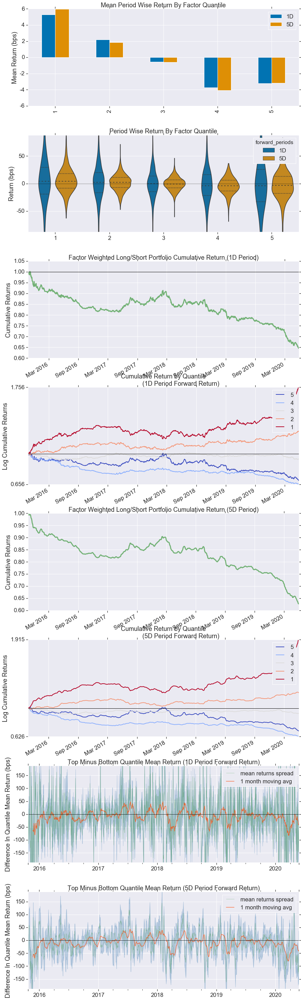

Information Analysis


,1D,5D
IC Mean,-0.00900000,-0.02600000
IC Std.,0.13900000,0.15200000
Risk-Adjusted IC,-0.06300000,-0.17000000
t-stat(IC),-2.12000000,-5.68200000
p-value(IC),0.03400000,0.00000000
IC Skew,0.10400000,0.05900000
IC Kurtosis,-0.00600000,-0.27000000


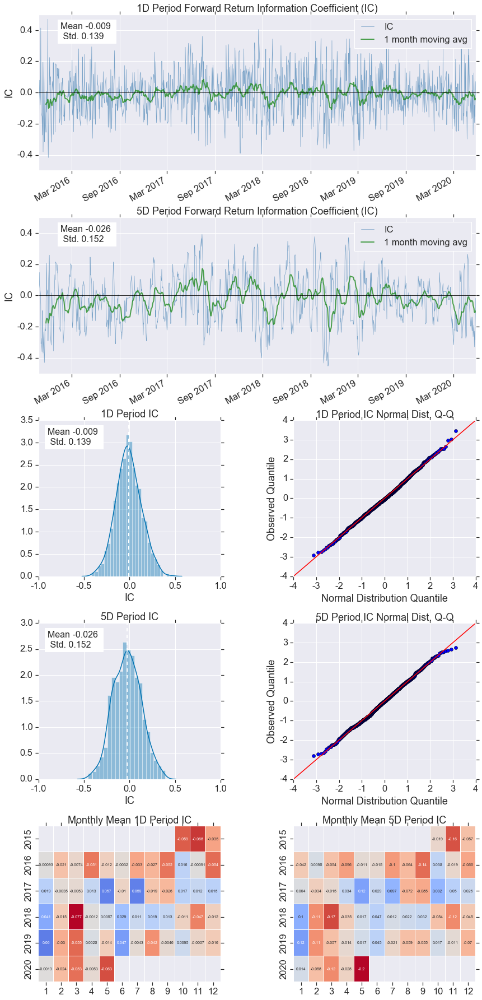

Turnover Analysis


,1D,5D
Quantile 1 Mean Turnover,0.01500000,0.05600000
Quantile 2 Mean Turnover,0.02500000,0.08700000
Quantile 3 Mean Turnover,0.02800000,0.09500000
Quantile 4 Mean Turnover,0.02400000,0.07900000
Quantile 5 Mean Turnover,0.01200000,0.04000000


,1D,5D
Mean Factor Rank Autocorrelation,1.00000000,0.99800000


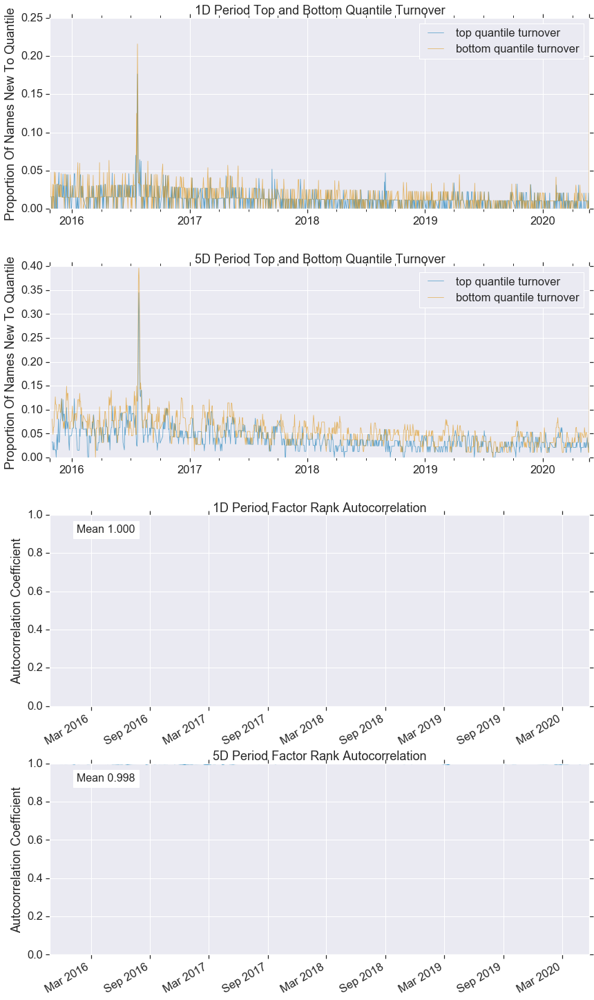

volatility_20d
Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-1.72851961,-0.95017557,-1.39524752,0.19078355,88482,20.10004362
2,-1.23657787,-0.33191363,-0.73331940,0.19671153,87827,19.95125032
3,-0.64369807,0.35770699,-0.06245048,0.20075617,87814,19.94829717
4,0.06775769,1.08627715,0.62469920,0.20752873,87827,19.95125032
5,0.78153745,1.72854817,1.34038037,0.21794375,88258,20.04915858


Returns Analysis


,1D,5D
Ann. alpha,-0.00400000,-0.01100000
beta,0.22300000,0.21300000
Mean Period Wise Return Top Quantile (bps),-0.57300000,-0.91300000
Mean Period Wise Return Bottom Quantile (bps),-3.03800000,-2.69900000
Mean Period Wise Spread (bps),1.57300000,0.86800000


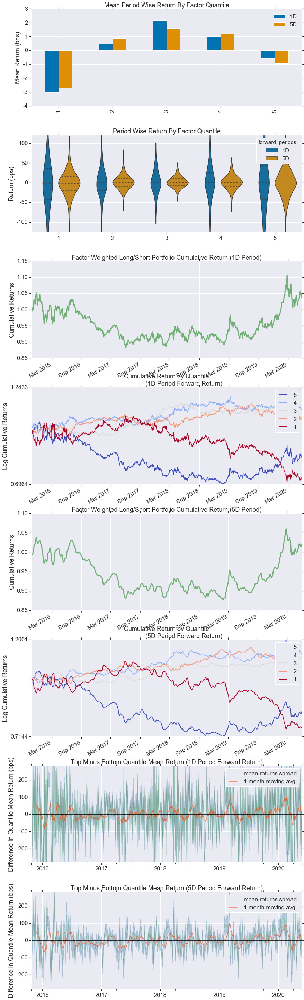

Information Analysis


,1D,5D
IC Mean,-0.01900000,-0.03000000
IC Std.,0.21700000,0.20800000
Risk-Adjusted IC,-0.08700000,-0.14500000
t-stat(IC),-2.90400000,-4.83600000
p-value(IC),0.00400000,0.00000000
IC Skew,0.22000000,0.08200000
IC Kurtosis,-0.18700000,-0.47200000


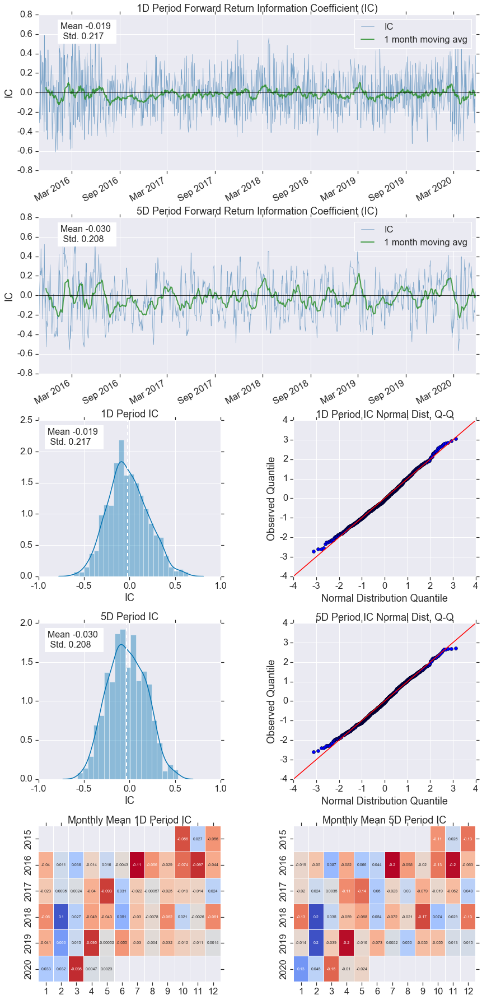

Turnover Analysis


,1D,5D
Quantile 1 Mean Turnover,0.07900000,0.21400000
Quantile 2 Mean Turnover,0.17500000,0.43600000
Quantile 3 Mean Turnover,0.19800000,0.48200000
Quantile 4 Mean Turnover,0.18000000,0.45200000
Quantile 5 Mean Turnover,0.08600000,0.25100000


,1D,5D
Mean Factor Rank Autocorrelation,0.97900000,0.89200000


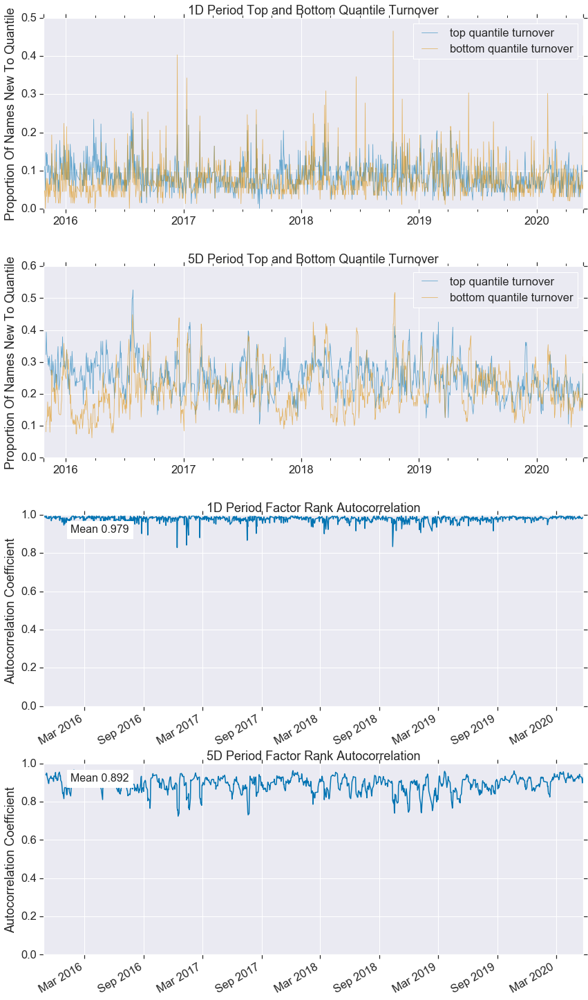

Momentum_1YR
Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-1.72844612,-0.99423310,-1.38329322,0.20102517,88482,20.10004362
2,-1.06755567,-0.29031651,-0.68992676,0.19978701,87827,19.95125032
3,-0.39656607,0.42121244,0.00131471,0.19977074,87814,19.94829717
4,0.28734789,1.11112937,0.69152427,0.19948331,87827,19.95125032
5,0.98539385,1.72844612,1.38354114,0.20072029,88258,20.04915858


Returns Analysis


,1D,5D
Ann. alpha,-0.03200000,-0.03300000
beta,-0.01400000,-0.03200000
Mean Period Wise Return Top Quantile (bps),-1.34700000,-0.97700000
Mean Period Wise Return Bottom Quantile (bps),1.37400000,1.73800000
Mean Period Wise Spread (bps),-3.26300000,-3.15800000


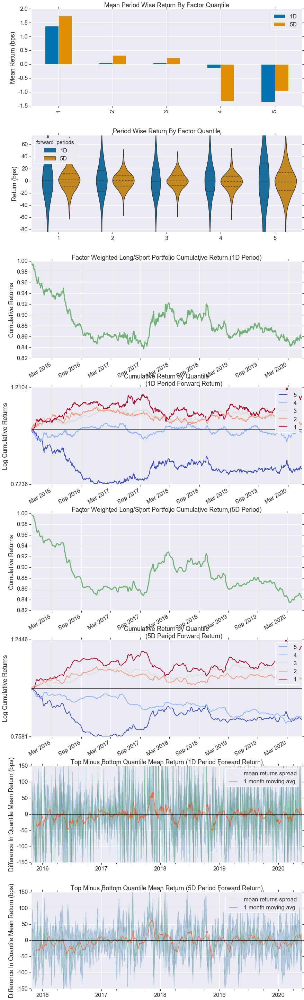

Information Analysis


,1D,5D
IC Mean,0.00000000,-0.00000000
IC Std.,0.11000000,0.12200000
Risk-Adjusted IC,0.00200000,-0.00400000
t-stat(IC),0.05400000,-0.11800000
p-value(IC),0.95700000,0.90600000
IC Skew,0.09100000,0.15400000
IC Kurtosis,0.46200000,0.41900000


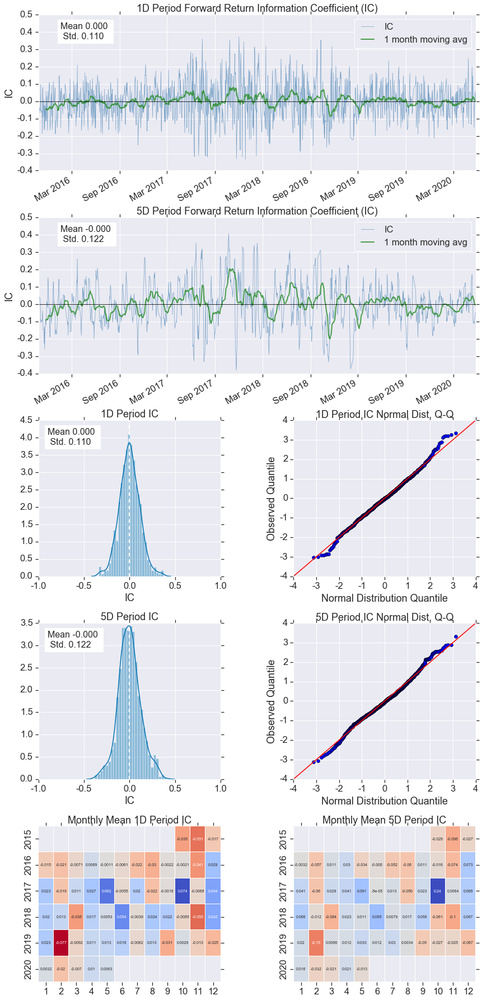

Turnover Analysis


,1D,5D
Quantile 1 Mean Turnover,0.05400000,0.13300000
Quantile 2 Mean Turnover,0.12000000,0.27200000
Quantile 3 Mean Turnover,0.14200000,0.30800000
Quantile 4 Mean Turnover,0.12400000,0.27400000
Quantile 5 Mean Turnover,0.05700000,0.13600000


,1D,5D
Mean Factor Rank Autocorrelation,0.99300000,0.96500000


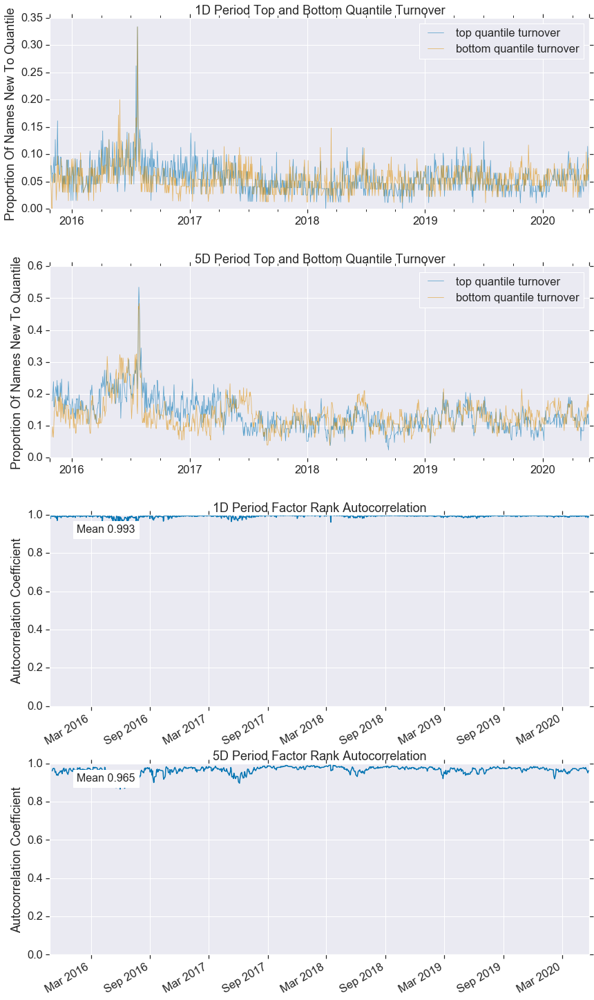

adv_20d
Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-1.72851961,-0.70339346,-1.28021080,0.22041506,88482,20.10004362
2,-1.06309822,-0.06098787,-0.60078836,0.21097091,87827,19.95125032
3,-0.38291288,0.57852018,0.07143030,0.20773043,87814,19.94829717
4,0.28204647,1.19880690,0.73737685,0.19981200,87827,19.95125032
5,0.98198074,1.72854817,1.40232212,0.19292503,88258,20.04915858


Returns Analysis


,1D,5D
Ann. alpha,-0.10500000,-0.10500000
beta,0.02100000,-0.01200000
Mean Period Wise Return Top Quantile (bps),-4.76800000,-4.70000000
Mean Period Wise Return Bottom Quantile (bps),5.09900000,5.35700000
Mean Period Wise Spread (bps),-9.84500000,-9.98500000


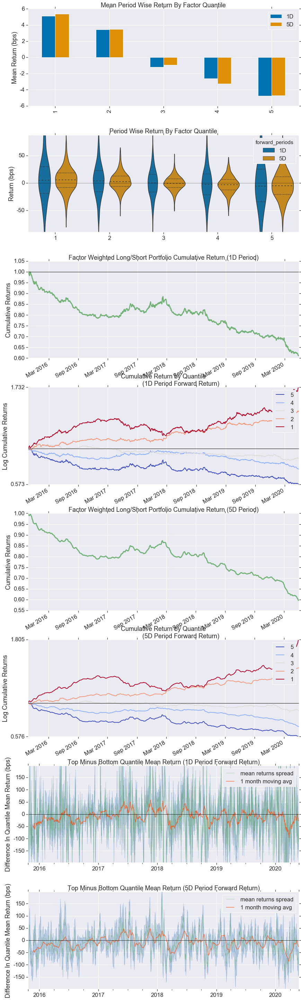

Information Analysis


,1D,5D
IC Mean,-0.01700000,-0.03800000
IC Std.,0.14500000,0.16000000
Risk-Adjusted IC,-0.11600000,-0.24000000
t-stat(IC),-3.88500000,-8.00500000
p-value(IC),0.00000000,0.00000000
IC Skew,0.09100000,0.18000000
IC Kurtosis,0.01600000,-0.22000000


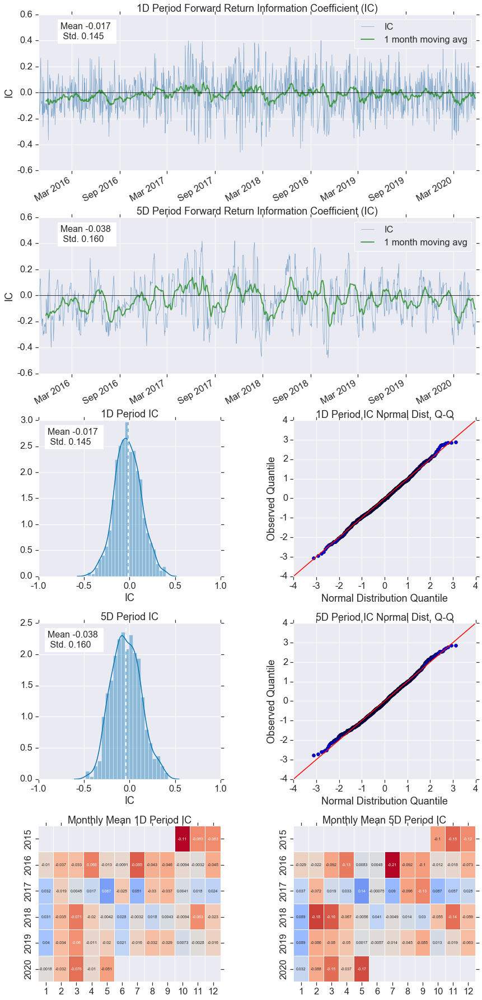

Turnover Analysis


,1D,5D
Quantile 1 Mean Turnover,0.03000000,0.11100000
Quantile 2 Mean Turnover,0.06300000,0.22700000
Quantile 3 Mean Turnover,0.06900000,0.25200000
Quantile 4 Mean Turnover,0.05700000,0.21100000
Quantile 5 Mean Turnover,0.02600000,0.09400000


,1D,5D
Mean Factor Rank Autocorrelation,0.99900000,0.98400000


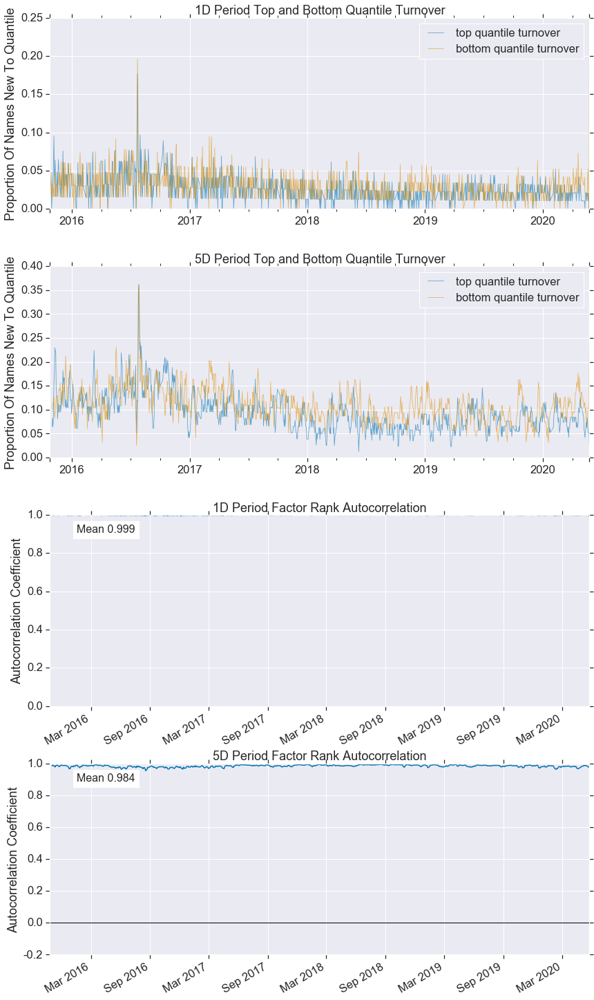

Mean_Reversion_Sector_Neutral_Smoothed
Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-1.72850515,-0.75777460,-1.37054591,0.20298194,88482,20.10004362
2,-1.08918866,-0.05629183,-0.68318136,0.19928142,87827,19.95125032
3,-0.44737931,0.59322926,-0.00333974,0.20098992,87814,19.94829717
4,0.22111349,1.13882696,0.68117645,0.20182735,87827,19.95125032
5,0.91481809,1.72851240,1.37426881,0.20486568,88258,20.04915858


Returns Analysis


,1D,5D
Ann. alpha,0.05100000,0.04100000
beta,0.01500000,0.05100000
Mean Period Wise Return Top Quantile (bps),3.01000000,2.46200000
Mean Period Wise Return Bottom Quantile (bps),-2.00200000,-1.44400000
Mean Period Wise Spread (bps),5.09200000,3.95300000


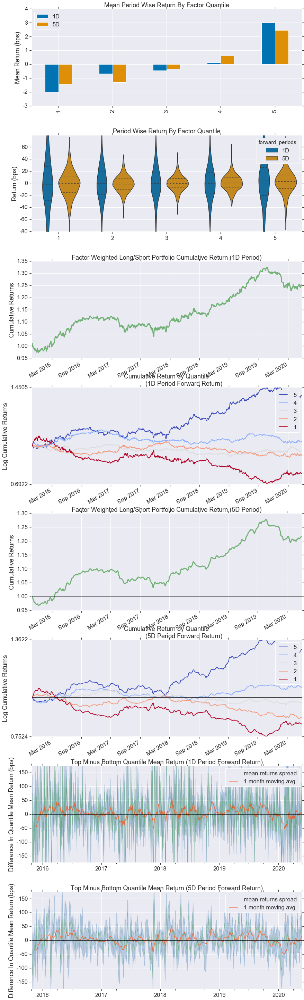

Information Analysis


,1D,5D
IC Mean,0.01100000,0.02200000
IC Std.,0.11900000,0.12300000
Risk-Adjusted IC,0.09300000,0.17500000
t-stat(IC),3.10900000,5.84800000
p-value(IC),0.00200000,0.00000000
IC Skew,0.03700000,0.05900000
IC Kurtosis,0.13100000,0.16000000


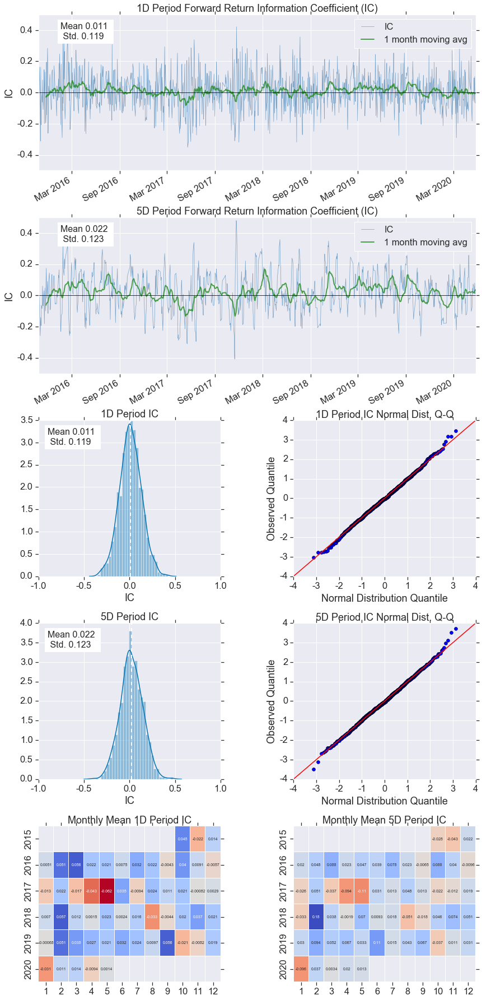

Turnover Analysis


,1D,5D
Quantile 1 Mean Turnover,0.06000000,0.26200000
Quantile 2 Mean Turnover,0.13100000,0.53300000
Quantile 3 Mean Turnover,0.14800000,0.58100000
Quantile 4 Mean Turnover,0.13100000,0.53300000
Quantile 5 Mean Turnover,0.06000000,0.26400000


,1D,5D
Mean Factor Rank Autocorrelation,0.99500000,0.90000000


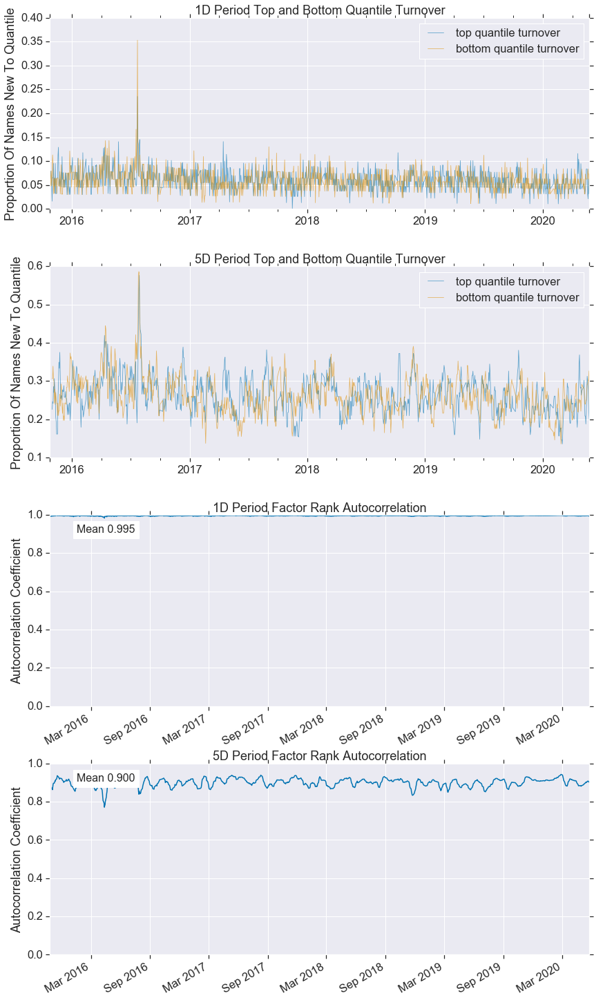

增强_ALPHA
Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-0.04581559,-0.00812975,-0.02056167,0.00605586,88482,20.10004362
2,-0.02206412,0.00024957,-0.00939747,0.00329224,87827,19.95125032
3,-0.01170595,0.01285334,-0.00146827,0.00324183,87814,19.94829717
4,-0.00386770,0.02472796,0.00670167,0.00441924,87827,19.95125032
5,0.00075369,0.05885062,0.01968150,0.00976528,88258,20.04915858


Returns Analysis


,1D,5D
Ann. alpha,0.22800000,0.19600000
beta,-0.16800000,-0.16900000
Mean Period Wise Return Top Quantile (bps),9.25300000,8.10500000
Mean Period Wise Return Bottom Quantile (bps),-9.29700000,-7.70500000
Mean Period Wise Spread (bps),18.61500000,15.85700000


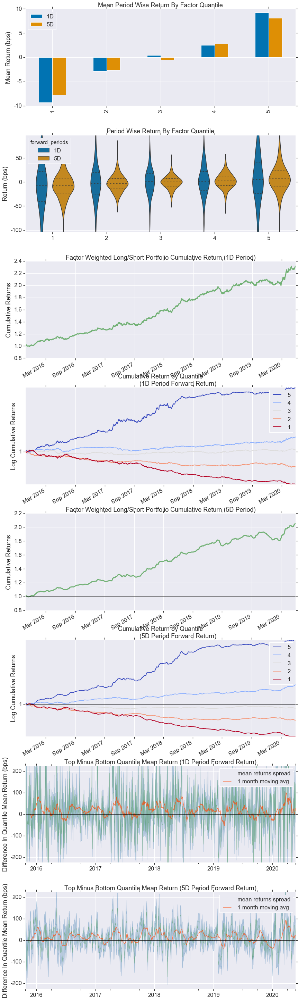

Information Analysis


,1D,5D
IC Mean,0.04400000,0.07800000
IC Std.,0.16900000,0.17100000
Risk-Adjusted IC,0.25900000,0.46000000
t-stat(IC),8.64300000,15.35900000
p-value(IC),0.00000000,0.00000000
IC Skew,-0.14800000,-0.09600000
IC Kurtosis,-0.18900000,-0.44700000


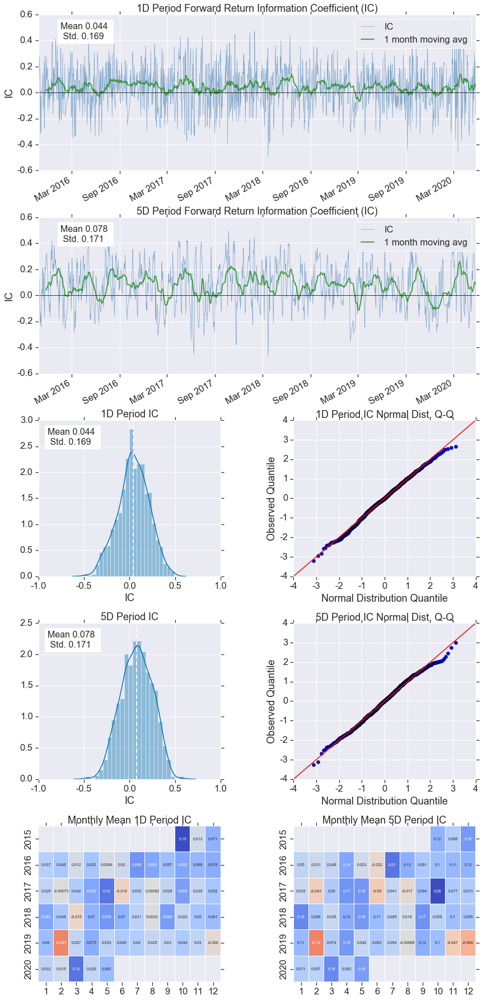

Turnover Analysis


,1D,5D
Quantile 1 Mean Turnover,0.18400000,0.22800000
Quantile 2 Mean Turnover,0.40600000,0.44300000
Quantile 3 Mean Turnover,0.43900000,0.47400000
Quantile 4 Mean Turnover,0.38100000,0.42400000
Quantile 5 Mean Turnover,0.18600000,0.20800000


,1D,5D
Mean Factor Rank Autocorrelation,0.91600000,0.91100000


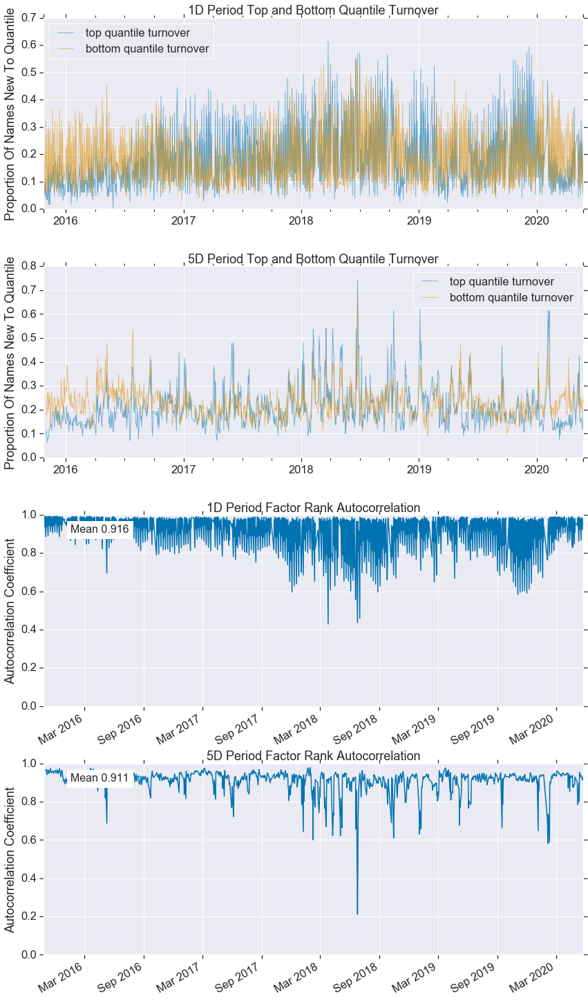

Overnight_Sentiment_Smoothed              0.00222997
adv_120d                                 -0.00882585
volatility_20d                           -0.01882002
Momentum_1YR                              0.00017909
adv_20d                                  -0.01684809
Mean_Reversion_Sector_Neutral_Smoothed    0.01105963
增强_ALPHA                                  0.04364600
dtype: float64


In [ ]:
factor_IC = show_sample_results(all_factors, pd.concat([X_train, X_valid]), clf, factor_names,max_loss=0.4)

In [ ]:
factor_IC = show_sample_results(all_factors, X_text, clf, factor_names,max_loss=0.4)

NameError: name 'X_text' is not defined